# Regression with Budget

Importing packages 

In [1]:
import pandas as pd
import numpy as np 
import pickle

import matplotlib.pyplot as plt 
import seaborn as sns
sns.set()
%config InlineBackend.figure_formats = ['svg'] 

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf

Loading pickled dataframe

In [2]:
fl_movies_wbudget3 = pd.read_pickle('fl_movies_wbudget3.pickle')

In [3]:
fl_movies_wbudget3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 561 entries, 0 to 560
Data columns (total 20 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   title                                          561 non-null    object        
 1   max_theaters                                   561 non-null    float64       
 2   num_opening_theaters                           561 non-null    float64       
 3   release_date                                   561 non-null    datetime64[ns]
 4   domestic_distributor                           561 non-null    object        
 5   earliest_release_location                      561 non-null    object        
 6   runtime                                        561 non-null    float64       
 7   genres                                         561 non-null    object        
 8   crew                                           561 non-null 

In [4]:
fl_movies_wbudget3['domestic_total_profit_real'].sort_values(ascending=False)

0      5.892062e+07
1      5.101934e+07
3      4.440122e+07
2      3.625460e+07
6      1.932220e+07
           ...     
89    -6.511188e+06
258   -6.913571e+06
264   -1.195530e+07
70    -2.111400e+07
281   -2.499459e+07
Name: domestic_total_profit_real, Length: 561, dtype: float64

Domestic total profit by year 

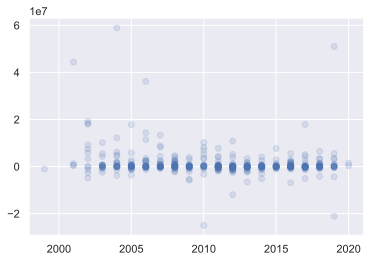

In [411]:
plt.scatter(fl_movies_wbudget3['year'],fl_movies_wbudget3['domestic_total_profit_real'], alpha=0.15)

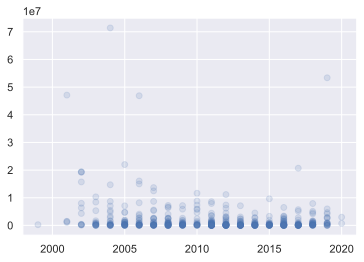

In [412]:
plt.scatter(fl_movies_wbudget3['year'],fl_movies_wbudget3['domestic_total_gross_real'], alpha=0.15)

(array([  2.,   1., 351., 189.,   9.,   5.,   0.,   1.,   1.,   2.]),
 array([-24994588.60201879, -16603067.50475333,  -8211546.40748787,
           179974.68977759,   8571495.78704305,  16963016.88430851,
         25354537.98157397,  33746059.07883942,  42137580.17610489,
         50529101.27337034,  58920622.37063581]),
 <BarContainer object of 10 artists>)

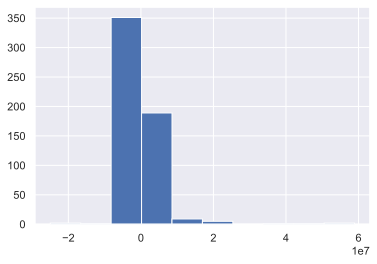

In [400]:
plt.hist(fl_movies_wbudget3['domestic_total_profit_real'])

### Note: IMDB may be misreporting budgets - League of Gods budget could not have been so low 

In [5]:
fl_movies_wbudget3[fl_movies_wbudget3['budget_usd_real'] <= 10000]['title'].head(10)

321          League of Gods
322                 Offside
447    A Melody to Remember
453           Conquest 1453
475       A Paris Education
516                   Grass
Name: title, dtype: object

In [6]:
fl_movies_wbudget3 = fl_movies_wbudget3[fl_movies_wbudget3['budget_usd_real'] > 10000]

In [7]:
fl_movies_wbudget3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 555 entries, 0 to 560
Data columns (total 20 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   title                                          555 non-null    object        
 1   max_theaters                                   555 non-null    float64       
 2   num_opening_theaters                           555 non-null    float64       
 3   release_date                                   555 non-null    datetime64[ns]
 4   domestic_distributor                           555 non-null    object        
 5   earliest_release_location                      555 non-null    object        
 6   runtime                                        555 non-null    float64       
 7   genres                                         555 non-null    object        
 8   crew                                           555 non-null 

In [8]:
min(fl_movies_wbudget3['budget_usd_real'])

15943.297343919232

Looking at the numeric subset of features to determine baseline features 

In [9]:
smaller_df = fl_movies_wbudget3.loc[:,['max_theaters','num_opening_theaters','runtime','year',
                                       'domestic_opening_real','domestic_total_gross_real',
                                       'earliest_release_location_opening_gross_real','earliest_release_location_original_gross_real',
                                       'budget_usd_real','domestic_total_profit_real','international_total_profit_real']]

In [422]:
sns.pairplot(smaller_df, height=1.2, aspect=1.5)

/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  self.fig.tight_layout(*args, **kwargs)


<AxesSubplot:>

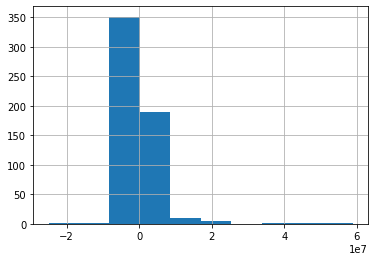

In [39]:
smaller_df.domestic_total_profit_real.hist()

In [423]:
smaller_df.corr()

,max_theaters,num_opening_theaters,runtime,year,domestic_opening_real,domestic_total_gross_real,earliest_release_location_opening_gross_real,earliest_release_location_original_gross_real,budget_usd_real,domestic_total_profit_real,international_total_profit_real
max_theaters,1.000000,0.590238,0.094802,-0.044883,0.525915,0.747601,0.079125,0.187670,0.177308,0.651165,0.199085
num_opening_theaters,0.590238,1.000000,0.137332,0.042194,0.816367,0.443544,0.136878,0.110081,0.113928,0.338474,0.086076
runtime,0.094802,0.137332,1.000000,0.030873,0.151331,0.107311,0.026897,0.028459,0.240826,0.023403,0.081309
year,-0.044883,0.042194,0.030873,1.000000,-0.005970,-0.157499,0.069665,0.023625,0.106376,-0.149082,0.091068
domestic_opening_real,0.525915,0.816367,0.151331,-0.005970,1.000000,0.605171,0.172990,0.156892,0.163491,0.514693,0.170704
domestic_total_gross_real,0.747601,0.443544,0.107311,-0.157499,0.605171,1.000000,0.096054,0.258461,0.170189,0.924067,0.298578
earliest_release_location_opening_gross_real,0.079125,0.136878,0.026897,0.069665,0.172990,0.096054,1.000000,0.975057,0.044841,0.086581,0.278577
earliest_release_location_original_gross_real,0.187670,0.110081,0.028459,0.023625,0.156892,0.258461,0.975057,1.000000,0.059466,0.245246,0.322038
budget_usd_real,0.177308,0.113928,0.240826,0.106376,0.163491,0.170189,0.044841,0.059466,1.000000,0.060931,0.323425
domestic_total_profit_real,0.651165,0.338474,0.023403,-0.149082,0.514693,0.924067,0.086581,0.245246,0.060931,1.000000,0.329845


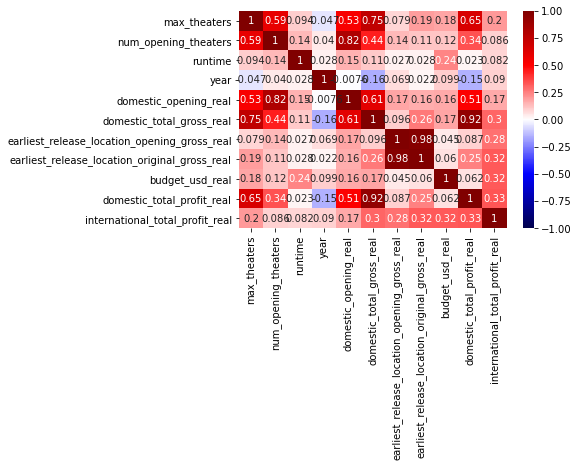

In [36]:
sns.heatmap(smaller_df.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

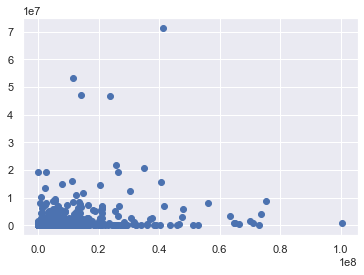

In [128]:
plt.scatter(smaller_df['budget_usd_real'], smaller_df['domestic_total_gross_real'])

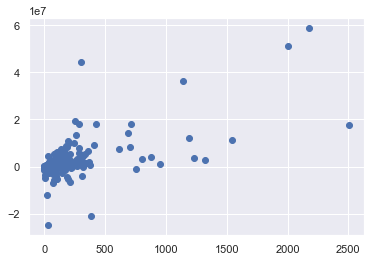

In [332]:
plt.scatter(smaller_df['max_theaters'], smaller_df['domestic_total_profit_real'])

Text(0.5, 1.05, 'Domestic Profit at Different Budgets')

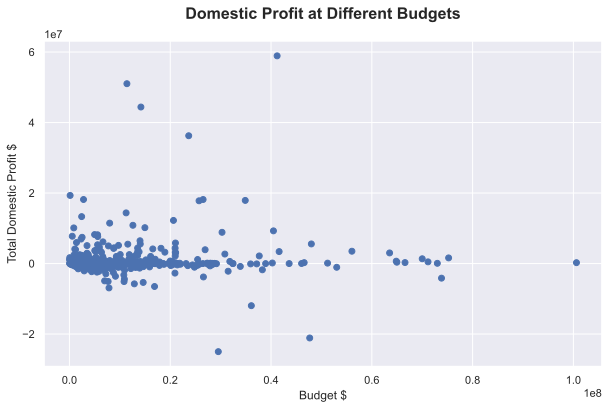

In [428]:
plt.figure(figsize=(10,6))
plt.scatter(fl_movies_wbudget3['budget_usd_real'], fl_movies_wbudget3['domestic_total_profit_real'])
plt.xlabel("Budget $")
plt.ylabel("Total Domestic Profit $")
plt.title("Domestic Profit at Different Budgets", weight='bold', fontsize=16, y=1.05)

Text(0.5, 1.05, 'International Profit at Different Budgets')

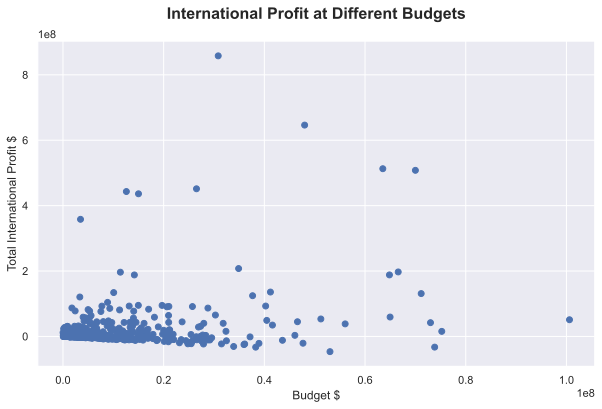

In [429]:
plt.figure(figsize=(10,6))
plt.scatter(fl_movies_wbudget3['budget_usd_real'], fl_movies_wbudget3['international_total_profit_real'])
plt.xlabel("Budget $")
plt.ylabel("Total International Profit $")
plt.title("International Profit at Different Budgets", weight='bold', fontsize=16, y=1.05)

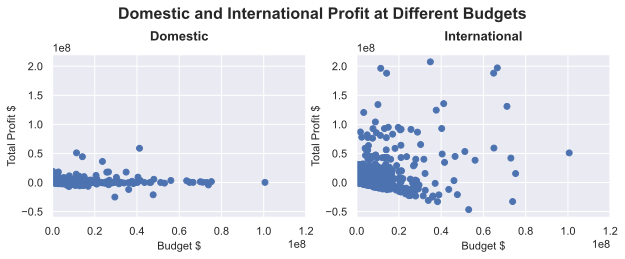

In [394]:
plt.figure(figsize=[10,3])
plt.suptitle('Domestic and International Profit at Different Budgets',fontsize = 16, weight='bold', y=1.1)

plt.subplot(1,2,1) # (number of rows, number of columns, number of plot)
plt.scatter(fl_movies_wbudget3['budget_usd_real'], fl_movies_wbudget3['domestic_total_profit_real'])
plt.xlabel("Budget $", fontsize=11)
plt.ylabel("Total Profit $", fontsize=11)
plt.title("Domestic", weight='bold', fontsize=13, y=1.05)
axes = plt.gca()
axes.set_ylim([-0.6e8,2.2e8])
axes.set_xlim([0,1.2e8])

plt.subplot(1,2,2)
plt.scatter(fl_movies_wbudget3['budget_usd_real'], fl_movies_wbudget3['international_total_profit_real'])
plt.xlabel("Budget $", fontsize=11)
plt.ylabel("Total Profit $", fontsize=11)
plt.title("International", weight='bold', fontsize=13, y=1.05)
axes = plt.gca()
axes.set_ylim([-0.6e8,2.2e8])
axes.set_xlim([0,1.2e8])

#plt.savefig('domestic_international_profit_budget.svg', bbox_inches='tight')
plt.show();

(array([  2.,   1., 351., 189.,   9.,   5.,   0.,   1.,   1.,   2.]),
 array([-24994588.60201879, -16603067.50475333,  -8211546.40748787,
           179974.68977759,   8571495.78704305,  16963016.88430851,
         25354537.98157397,  33746059.07883942,  42137580.17610489,
         50529101.27337034,  58920622.37063581]),
 <BarContainer object of 10 artists>)

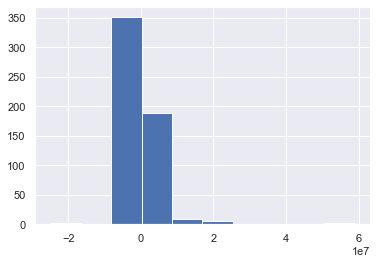

In [168]:
plt.hist(smaller_df['domestic_total_profit_real'])

The target is not normally distributed...  
Looking at the log transformation of the target

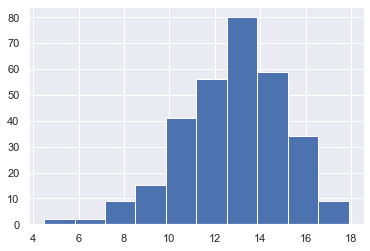

In [169]:
np.log(smaller_df.domestic_total_profit_real).hist();

In [267]:
fl_movies_wbudget3[fl_movies_wbudget3['domestic_total_profit_real'] <= 0]['domestic_total_profit_real'].sort_values(ascending=True)

281   -2.499459e+07
70    -2.111400e+07
264   -1.195530e+07
258   -6.913571e+06
89    -6.511188e+06
           ...     
537   -4.742965e+02
551   -3.636158e+02
415   -3.086861e+02
531   -3.084869e+02
558   -2.433448e+02
Name: domestic_total_profit_real, Length: 254, dtype: float64

In [271]:
fl_movies_wbudget3.iloc[280:282, 16:20]

,earliest_release_location_original_gross_real,budget_usd_real,domestic_total_profit_real,international_total_profit_real
280,318871.204677,5.581896e+06,2.337787e+05,1.510162e+07
281,33629.332470,2.953660e+07,-2.499459e+07,-4.171952e+06


In [430]:
min(fl_movies_wbudget3['domestic_total_profit_real'])

-24994588.602018792

In [10]:
constant_target_list = []
min_target = min(fl_movies_wbudget3['domestic_total_profit_real'])

for profit in fl_movies_wbudget3['domestic_total_profit_real']:
    constant_target_list.append((profit - min_target) + 1)
constant_target_list

fl_movies_wbudget3['constant_target'] = constant_target_list

In [11]:
min(fl_movies_wbudget3['constant_target'])

1.0

Observations:
- The target is not normally distributed - use log transformation
- Lots of outliers 
- Obvious multicollinearity between profits and grosses 
- Heteroskedacity of features

## Baseline model 

Setting up features and target

In [433]:
features = ['max_theaters','num_opening_theaters',
            'domestic_opening_real','earliest_release_location_opening_gross_real',
            'earliest_release_location_original_gross_real',
            'budget_usd_real','international_total_profit_real']
target = 'domestic_total_profit_real'
target_wconstant = 'constant_target'

Splitting data into training and testing sets

In [289]:
X = fl_movies_wbudget3.loc[:, features]
y = fl_movies_wbudget2[target]
#y_trans = np.log(fl_movies_wbudget3[target_wconstant])

X, X_test, y, y_test = train_test_split(X, y, test_size=.1, random_state=42)

Splitting data into training and validation sets

In [290]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=42)

### Linear regression model attempt 1 

In [291]:
lr = LinearRegression()
lr.fit(X_train,y_train)
lr.score(X_train,y_train)

0.8308545507116212

In [294]:
lr.score(X_val,y_val)

-5.2744379340615035

The model is overfitting a lot...

In [295]:
print(lr.coef_)

[ 4.42674660e+02 -3.58217282e+03  3.71782821e+00 -3.37628279e+00
  8.07607494e-01 -4.09284991e-02  6.00705053e-03]


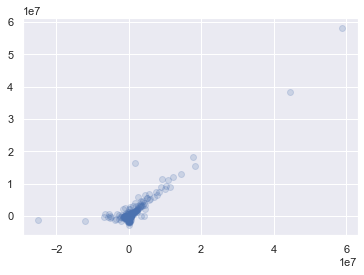

In [293]:
y_train_pred = lr.predict(X_train)

plt.scatter(y_train, y_train_pred, alpha=0.2)
plt.plot([0, 400], [0, 400])

Text(0.5, 1.0, 'Residuals vs. Predictions')

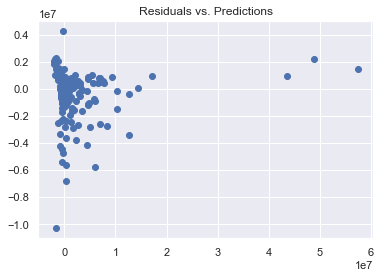

In [163]:
lr_residuals = y_train - y_train_pred

plt.scatter(y_train_pred, lr_residuals)
plt.plot([0,400], [0, 0])
plt.title("Residuals vs. Predictions")

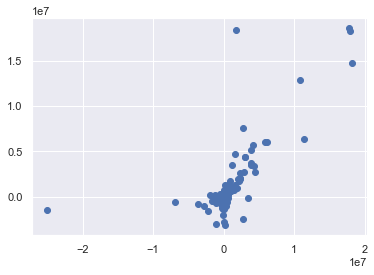

In [162]:
y_val_pred = lr.predict(X_val)

plt.scatter(y_val, y_val_pred)
plt.plot([0, 400], [0, 400])

It seems that the model is overfitting. It might be best to use regularization...

### Lasso model atttempt 1

In [93]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

Fit the Standard Scaler to the training data (essentially it finds the mean and standard deviation of each variable in the training set)

In [164]:
std = StandardScaler()
std.fit(X_train)

StandardScaler()

Apply the scaler to the train set (subtracts the mean it learned in the previous step and then divides by the standard deviation)

In [165]:
X_tr = std.transform(X_train)

Apply the scaler to the validation set

In [166]:
X_vl = std.transform(X_val)

(array([219.,  92.,  29.,  17.,   6.,   6.,   4.,   1.,   2.,   2.]),
 array([-0.83888744, -0.18916287,  0.4605617 ,  1.11028627,  1.76001084,
         2.40973541,  3.05945997,  3.70918454,  4.35890911,  5.00863368,
         5.65835825]),
 <BarContainer object of 10 artists>)

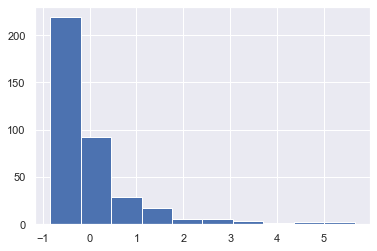

In [118]:
plt.hist(X_tr[:,5])

In [97]:
lasso_model = Lasso(alpha = 0.1)
lasso_model.fit(X_tr,y_train)

/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 241433316974739.16, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

Comparing the importance of features 

In [98]:
list(zip(X_train.columns, lasso_model.coef_))

[('max_theaters', -66972.79296017876),
 ('num_opening_theaters', -605173.3174760772),
 ('domestic_opening_real', 3692755.7533911145),
 ('earliest_release_location_opening_gross_real', -21488765.20873864),
 ('earliest_release_location_original_gross_real', 21650211.250503507),
 ('budget_usd_real', -447346.3141135944),
 ('international_total_profit_real', 456905.56751697685)]

In [99]:
lasso_model.score(X_tr,y_train)

0.9367289937514133

In [100]:
lr.score(X_vl,y_val)

-0.07540985508717712

#### Testing different alphas 

In [107]:
def mae(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true)) 

In [108]:
alphalist = 10**(np.linspace(-2,2,200))
err_vec_val = np.zeros(len(alphalist))
err_vec_train = np.zeros(len(alphalist))

for i,curr_alpha in enumerate(alphalist):

    # note the use of a new sklearn utility: Pipeline to pack
    # multiple modeling steps into one fitting process 
    steps = [('standardize', StandardScaler()), 
             ('lasso', Lasso(alpha = curr_alpha))]

    pipe = Pipeline(steps)
    pipe.fit(X_train, y_train)
    
    val_set_pred = pipe.predict(X_val)
    err_vec_val[i] = mae(y_val, val_set_pred)

/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 310262920837780.3, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 309826976449275.1, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 309371365201811.9, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/

/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 263954567743283.56, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 261685230194215.3, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259339625961092.34, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabel

/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114567064907794.34, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110331763107024.9, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106142775211416.88, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabel

/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25138595923948.062, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23508715478916.812, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabell/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21965921254464.25, tolerance: 1010525137965.4395
  model = cd_fast.enet_coordinate_descent(
/Users/ceciliabel

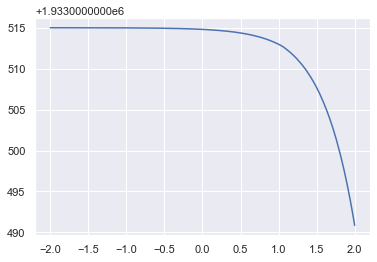

In [109]:
#plot the curve of validation error as alpha changes
plt.plot(np.log10(alphalist), err_vec_val)

In [110]:
## This is the minimum error achieved on the validation set 
## across the different alpha values we tried
np.min(err_vec_val)

1933490.8452730055

In [111]:
## This is the value of alpha that gave us the lowest error
alphalist[np.argmin(err_vec_val)]

100.0

### Lasso model attempt 2

In [119]:
std = StandardScaler()
std.fit(X_train.values)

StandardScaler()

In [120]:
lasso_model = Lasso(alpha = 100)
lasso_model.fit(X_tr,y_train)
X_tr = std.transform(X_train)
X_vl = std.transform(X_val)

In [121]:
list(zip(X_train.columns, lasso_model.coef_))

[('max_theaters', -64197.85354439403),
 ('num_opening_theaters', -606017.7931005673),
 ('domestic_opening_real', 3691656.9725331543),
 ('earliest_release_location_opening_gross_real', -21473390.104257006),
 ('earliest_release_location_original_gross_real', 21634652.41743401),
 ('budget_usd_real', -447498.9068656501),
 ('international_total_profit_real', 457168.9851603929)]

In [122]:
lasso_model.score(X_tr,y_train)

0.9367288642868167

In [123]:
lasso_model.score(X_vl,y_val)

-0.07673344834545248

### Linear regression attempt 2 with more features 

In [310]:
features2 = ['max_theaters', 'domestic_opening_real',
            'earliest_release_location_original_gross_real',
            'budget_usd_real','international_total_profit_real', 'drama','comedy','romance',
           'action','thriller','war','history','horror','mystery','apac_china','germany','miramax',
           'neon','sony_pc']
target = 'domestic_total_profit_real'
#target_wconstant = 'constant_target'

In [311]:
X = fl_movies_wbudget3.loc[:, features2]
y = fl_movies_wbudget2[target]
#y_trans = np.log(fl_movies_wbudget3[target_wconstant])

X, X_test, y, y_test = train_test_split(X, y, test_size=.1, random_state=42)

In [312]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=42)

In [313]:
lr = LinearRegression()
lr.fit(X_train,y_train)
lr.score(X_train,y_train)

0.8370263269767984

In [314]:
lr.score(X_val,y_val)

-34.95108368666841

In [315]:
print(lr.coef_)

[ 4.46759283e+02 -2.81672095e-03  7.81429360e-01 -3.67485052e-02
  6.98758905e-03 -3.46593719e+05  6.41001537e+04  1.40254862e+05
 -7.20766153e+05 -6.27915336e+05 -7.65384026e+04  2.76611222e+05
 -2.50888391e+05  3.39292108e+05  1.74013870e+05  4.16843863e+05
  1.92979272e+06  0.00000000e+00  7.52836219e+04]


### Lasso regression attempt 3 with more features 

In [319]:
features2 = ['max_theaters', 'domestic_opening_real',
            'earliest_release_location_original_gross_real',
            'budget_usd_real','international_total_profit_real', 'drama','comedy','romance',
           'action','thriller','war','history','horror','mystery','apac_china','germany','miramax',
           'neon','sony_pc']
target = 'domestic_total_profit_real'
#target_wconstant = 'constant_target'

In [326]:
X = fl_movies_wbudget3.loc[:, features2]
y = fl_movies_wbudget2[target]
#y_trans = np.log(fl_movies_wbudget3[target_wconstant])

X, X_test, y, y_test = train_test_split(X, y, test_size=.1, random_state=42)

In [327]:
std = StandardScaler()
std.fit(X_train.values)

StandardScaler()

In [328]:
lasso_model = Lasso(alpha = 100)
lasso_model.fit(X_train,y_train)
X_tr = std.transform(X_train)
X_vl = std.transform(X_val)

In [329]:
list(zip(X_train.columns, lasso_model.coef_))

[('max_theaters', 446.99613424466077),
 ('domestic_opening_real', -0.002708017465041111),
 ('earliest_release_location_original_gross_real', 0.7815810736702699),
 ('budget_usd_real', -0.036741927434033934),
 ('international_total_profit_real', 0.006988684525316002),
 ('drama', -345466.7524133727),
 ('comedy', 63912.45396241864),
 ('romance', 139721.70798407713),
 ('action', -720145.8859115546),
 ('thriller', -627559.1231225963),
 ('war', -75098.29816485732),
 ('history', 274967.4357336122),
 ('horror', -249752.99191471585),
 ('mystery', 337511.7237701669),
 ('apac_china', 166767.143438534),
 ('germany', 412733.5213003637),
 ('miramax', 1921045.4896823082),
 ('neon', 0.0),
 ('sony_pc', 73847.53477905963)]

In [330]:
lasso_model.score(X_tr,y_train)

0.18081893374097358

In [331]:
lasso_model.score(X_vl,y_val)

-0.3884108059826059

Splitting training data into multiple folds for validation 

In [61]:
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

### Linear regression with k-folds 

In [62]:
lm = LinearRegression()

scores = cross_val_score(lm, X_train, y_train, cv=kfold)
print(scores)
print("Linear Regression Mean Score: ", np.mean(scores))

# Build the Model
lm.fit(X_train, y_train)

[   0.92387042 -123.90943875    0.52725118    0.76857254    0.94843086]
Linear Regression Mean Score:  -24.14826274970801


LinearRegression()

In [63]:
print(lm.intercept_)
print(lm.coef_)

-348696.2302802582
[ 6.96403109e+02 -2.80128565e+03  2.63111385e+00 -2.50561196e+00
  8.40326594e-01 -3.94327730e-02  7.01145833e-03]


Not good...

### Baseline ridge 

In [359]:
X, y = np.array(X), np.array(y)

In [360]:
#run the CV

kf = KFold(n_splits=5, shuffle=True, random_state = 71)
cv_lm_r2s, cv_lm_reg_r2s = [], [] #collect the validation results for both models

for train_ind, val_ind in kf.split(X,y):
    
    X_train, y_train = X[train_ind], y[train_ind]
    X_val, y_val = X[val_ind], y[val_ind] 
    
    #simple linear regression
    lm = LinearRegression()
    lm_reg = Ridge(alpha=1)

    lm.fit(X_train, y_train)
    cv_lm_r2s.append(lm.score(X_val, y_val))
    
    #ridge with feature scaling
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    
    lm_reg.fit(X_train_scaled, y_train)
    cv_lm_reg_r2s.append(lm_reg.score(X_val_scaled, y_val))

print('Simple regression scores: ', cv_lm_r2s)
print('Ridge scores: ', cv_lm_reg_r2s, '\n')

print(f'Simple mean cv r^2: {np.mean(cv_lm_r2s):.3f} +- {np.std(cv_lm_r2s):.3f}')
print(f'Ridge mean cv r^2: {np.mean(cv_lm_reg_r2s):.3f} +- {np.std(cv_lm_reg_r2s):.3f}')

Simple regression scores:  [0.6786599037654373, 0.39578964921715565, 0.72764924558843, 0.22693498396809564, -38.01648570179445]
Ridge scores:  [0.6787590249785751, 0.39576055772356544, 0.7285660038091496, 0.2272983200615366, -37.346525000793775] 

Simple mean cv r^2: -7.197 +- 15.411
Ridge mean cv r^2: -7.063 +- 15.143


In [361]:
### LOOK AT THE LAST K-FOLD: 

## Feature engineering categorical variables 

#### Creating dummy variables for certain genres 

In [205]:
fl_movies_wbudget3['genres'].value_counts().head()

Drama                   66
Comedy Drama            41
Drama Romance           34
Comedy Drama Romance    27
Crime Drama             13
Name: genres, dtype: int64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

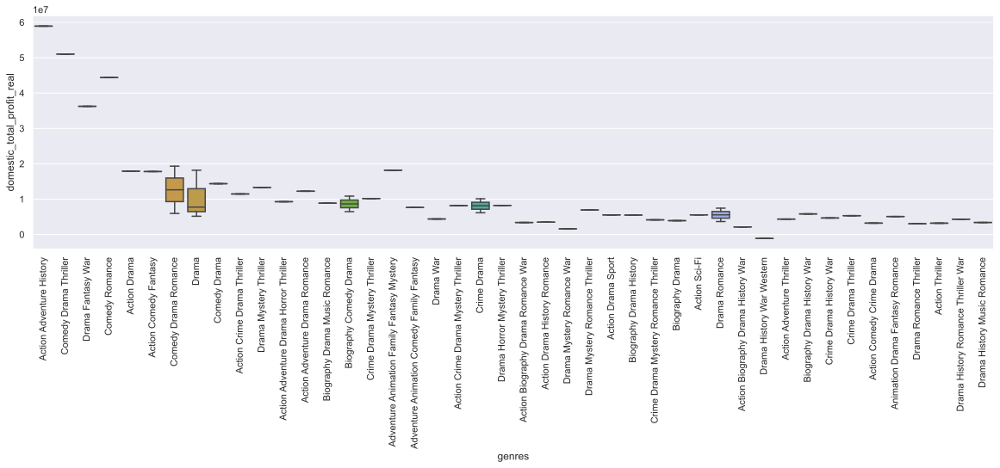

In [35]:
plt.figure(figsize=(20,5))
ax = sns.boxplot(x=fl_movies_wbudget3['genres'][0:50], 
                 y=fl_movies_wbudget3['domestic_total_profit_real'])
plt.setp(ax.get_xticklabels(), rotation=90)

In [12]:
drama_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'Drama' in genre:
        drama_list.append(1)
    else:
        drama_list.append(0)
drama_list

[0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,


In [14]:
fl_movies_wbudget3['drama'] = drama_list

In [15]:
comedy_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'Comedy' in genre:
        comedy_list.append(1)
    else:
        comedy_list.append(0)
drama_list

fl_movies_wbudget3['comedy'] = comedy_list

In [16]:
romance_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'Romance' in genre:
        romance_list.append(1)
    else:
        romance_list.append(0)
romance_list

fl_movies_wbudget3['romance'] = romance_list

In [17]:
action_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'Action' in genre:
        action_list.append(1)
    else:
        action_list.append(0)
action_list

fl_movies_wbudget3['action'] = action_list

In [18]:
thriller_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'Thriller' in genre:
        thriller_list.append(1)
    else:
        thriller_list.append(0)
thriller_list

fl_movies_wbudget3['thriller'] = thriller_list

In [19]:
war_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'War' in genre:
        war_list.append(1)
    else:
        war_list.append(0)
war_list

fl_movies_wbudget3['war'] = war_list

In [20]:
history_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'History' in genre:
        history_list.append(1)
    else:
        history_list.append(0)
history_list

fl_movies_wbudget3['history'] = history_list

In [21]:
horror_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'Horror' in genre:
        horror_list.append(1)
    else:
        horror_list.append(0)
horror_list

fl_movies_wbudget3['horror'] = horror_list

In [22]:
mystery_list = []
for genre in fl_movies_wbudget3['genres']:
    if 'Mystery' in genre:
        mystery_list.append(1)
    else:
        mystery_list.append(0)
mystery_list

fl_movies_wbudget3['mystery'] = mystery_list

In [23]:
fl_movies_wbudget3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 555 entries, 0 to 560
Data columns (total 30 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   title                                          555 non-null    object        
 1   max_theaters                                   555 non-null    float64       
 2   num_opening_theaters                           555 non-null    float64       
 3   release_date                                   555 non-null    datetime64[ns]
 4   domestic_distributor                           555 non-null    object        
 5   earliest_release_location                      555 non-null    object        
 6   runtime                                        555 non-null    float64       
 7   genres                                         555 non-null    object        
 8   crew                                           555 non-null 

### Creating dummy variables for earliest release locations

In [24]:
fl_movies_wbudget3['earliest_release_location'].value_counts().head()

France         82
EMEA           57
APAC           43
South Korea    27
Italy          27
Name: earliest_release_location, dtype: int64

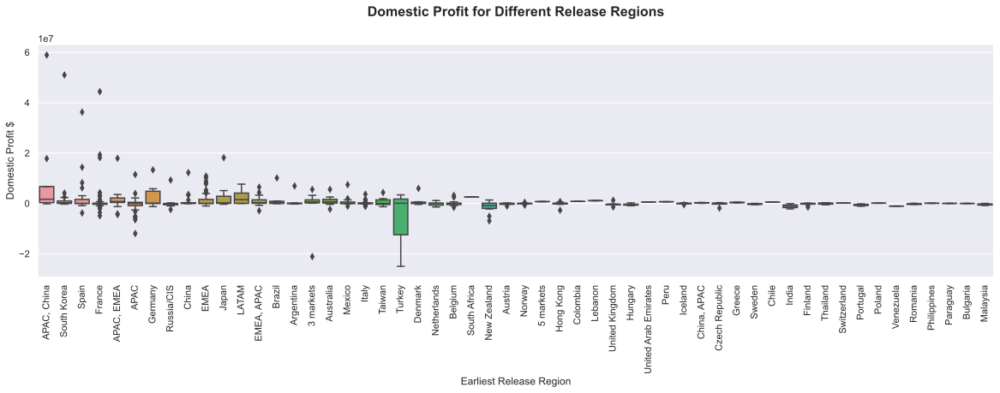

In [40]:
%config InlineBackend.figure_formats = ['svg']
plt.figure(figsize=(20,5))
ax = sns.boxplot(x=fl_movies_wbudget3['earliest_release_location'], 
                 y=fl_movies_wbudget3['domestic_total_profit_real'])
plt.xlabel('Earliest Release Region')
plt.ylabel('Domestic Profit $')
plt.title('Domestic Profit for Different Release Regions', fontsize = 16, weight='bold', y=1.1)
plt.setp(ax.get_xticklabels(), rotation=90)
plt.savefig('release_regions', bbox_inches='tight');

In [26]:
apacchina_list = []
for location in fl_movies_wbudget3['earliest_release_location']:
    if 'APAC, China' in location:
        apacchina_list.append(1)
    else:
        apacchina_list.append(0)
apacchina_list

fl_movies_wbudget3['apac_china'] = apacchina_list

In [27]:
germany_list = []
for location in fl_movies_wbudget3['earliest_release_location']:
    if 'Germany' in location:
        germany_list.append(1)
    else:
        germany_list.append(0)
germany_list

fl_movies_wbudget3['germany'] = germany_list

### Looking at domestic distributors 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

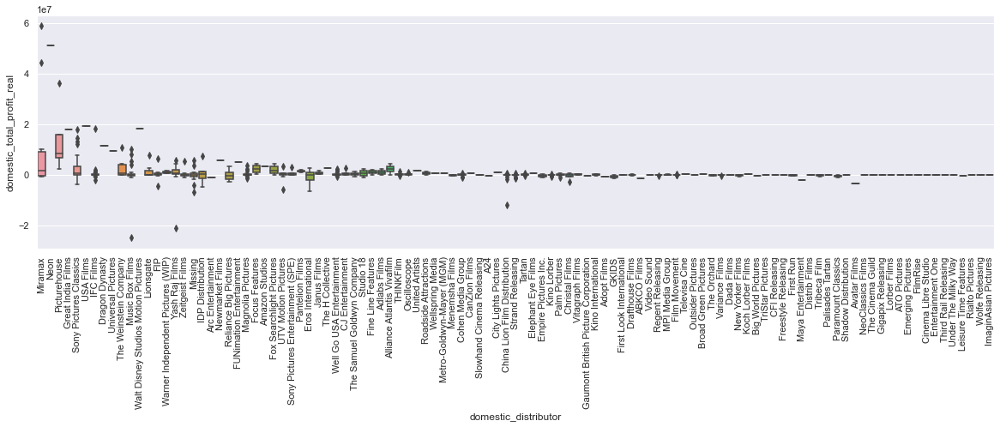

In [242]:
plt.figure(figsize=(20,5))
ax = sns.boxplot(x=fl_movies_wbudget3['domestic_distributor'], 
                 y=fl_movies_wbudget3['domestic_total_profit_real'])
plt.setp(ax.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

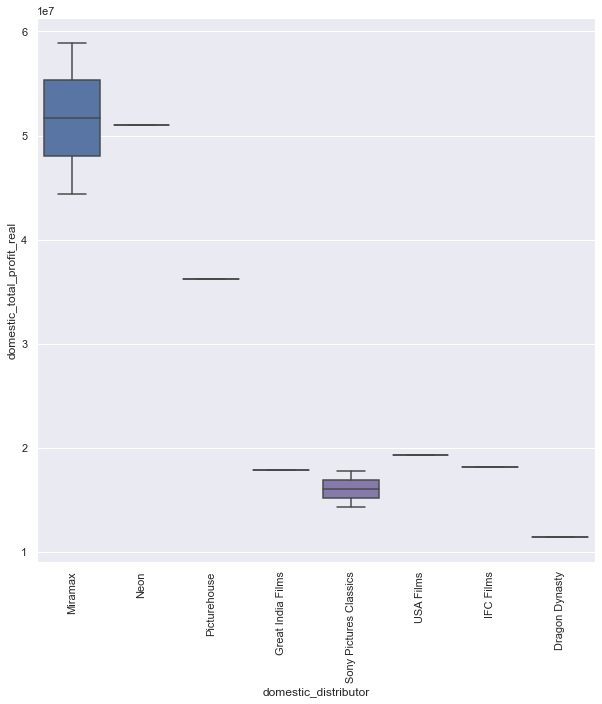

In [252]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(x=fl_movies_wbudget3['domestic_distributor'][0:10], 
                 y=fl_movies_wbudget3['domestic_total_profit_real'])
plt.setp(ax.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

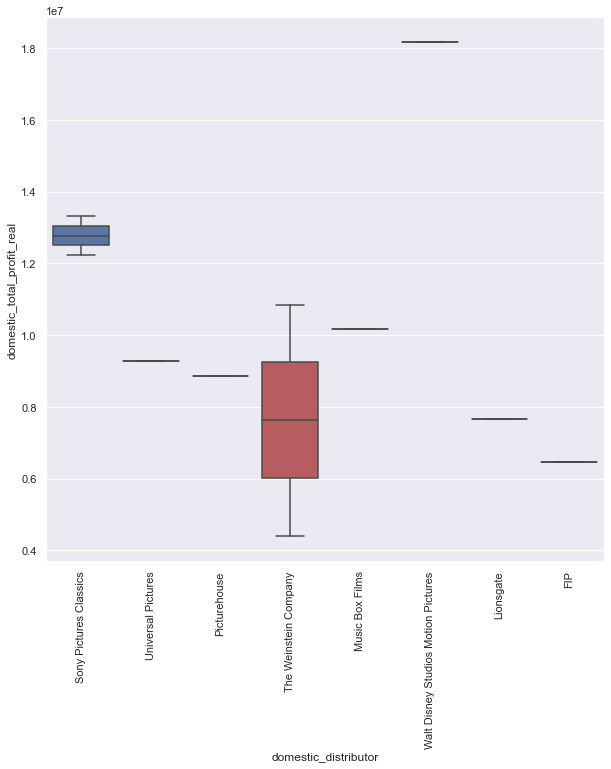

In [253]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(x=fl_movies_wbudget3['domestic_distributor'][10:20], 
                 y=fl_movies_wbudget3['domestic_total_profit_real'])
plt.setp(ax.get_xticklabels(), rotation=90)

In [250]:
fl_movies_wbudget3['domestic_distributor'].value_counts().head(40)

Sony Pictures Classics               60
IFC Films                            34
Music Box Films                      29
Eros International                   27
Magnolia Pictures                    26
Well Go USA Entertainment            23
Strand Releasing                     20
Yash Raj Films                       20
Missing                              16
China Lion Film Distribution         16
Film Movement                        13
Kino Lorber                          13
UTV Motion Pictures                  12
Miramax                              10
Cohen Media Group                    10
Sony Pictures Entertainment (SPE)     9
CJ Entertainment                      8
FIP                                   8
The Weinstein Company                 7
Zeitgeist Films                       7
Regent Releasing                      7
Lionsgate                             7
Tartan                                7
New Yorker Films                      6
Palm Pictures                         6


In [28]:
miramax_list = []
for dd in fl_movies_wbudget3['domestic_distributor']:
    if 'Miramax' in dd:
        miramax_list.append(1)
    else:
        miramax_list.append(0)
miramax_list

fl_movies_wbudget3['miramax'] = miramax_list

In [29]:
neon_list = []
for dd in fl_movies_wbudget3['domestic_distributor']:
    if 'Neon' in dd:
        neon_list.append(1)
    else:
        neon_list.append(0)
neon_list

fl_movies_wbudget3['neon'] = neon_list

In [30]:
sony_pc_list = []
for dd in fl_movies_wbudget3['domestic_distributor']:
    if 'Sony Pictures Classics' in dd:
        sony_pc_list.append(1)
    else:
        sony_pc_list.append(0)
sony_pc_list

fl_movies_wbudget3['sony_pc'] = sony_pc_list

In [31]:
fl_movies_wbudget3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 555 entries, 0 to 560
Data columns (total 35 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   title                                          555 non-null    object        
 1   max_theaters                                   555 non-null    float64       
 2   num_opening_theaters                           555 non-null    float64       
 3   release_date                                   555 non-null    datetime64[ns]
 4   domestic_distributor                           555 non-null    object        
 5   earliest_release_location                      555 non-null    object        
 6   runtime                                        555 non-null    float64       
 7   genres                                         555 non-null    object        
 8   crew                                           555 non-null 

### Looking at languages 

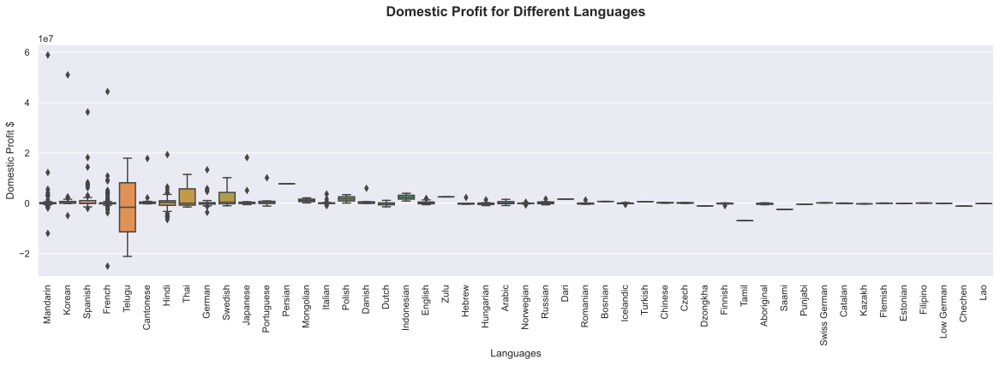

In [41]:
%config InlineBackend.figure_formats = ['svg']
plt.figure(figsize=(20,5))
ax = sns.boxplot(x=fl_movies_wbudget3['language'], 
                 y=fl_movies_wbudget3['domestic_total_profit_real'])
plt.xlabel('Languages')
plt.ylabel('Domestic Profit $')
plt.title('Domestic Profit for Different Languages', fontsize = 16, weight='bold', y=1.1)
plt.setp(ax.get_xticklabels(), rotation=90)
plt.savefig('languages_profit', bbox_inches='tight');

In [33]:
fl_movies_wbudget3.to_pickle('fl_movies_wbudget4.pickle')